In [1]:
from pycitylayers.client import Client
from pycitylayers.utils import PointGQL, PolygonGQL
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from shapely.geometry import Polygon, Point, MultiPolygon
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import geopandas as gpd
import contextily as cx
from tqdm import tqdm
import json
import utilities as ut


This notebook is the main preprocessing notebook

# Pull data


### from Pycitylayers (building lots, Tracts)

Fetching Metadata. Please Wait ...
building lots collection acquired
selecting 35213 buildings in 3889 m radius of point -73.589693,45.508574


,borough_id,building_number,built_area,dwelling_number,firstletter_apt,geom,index,land_area,landuse_code,landuse_text,lastletter_apt,max_floors,municipality_code,nad83_registration,street_name,street_number,uid,unit_category,unit_number,year_built
0,REM19,1250,253,1,0,"{'type': 'Polygon', 'crs': {'type': 'name', 'p...",0,34,1000,Logement,0,0,50,9840-22-7858-8-001-0103,avenue des Pins Ouest (MTL),1250,1038640,Condominium,1040,1979
1,REM21,3634,221,6,0,"{'type': 'Polygon', 'crs': {'type': 'name', 'p...",37,424,1000,Logement,0,3,50,9840-69-2540-8-000-0000,rue Lorne-Crescent (MTL),3634,1038394,Régulier,0,1890
2,REM20,1510,286,2,0,"{'type': 'Polygon', 'crs': {'type': 'name', 'p...",38,215,1000,Logement,0,3,50,9938-69-1368-7-000-0000,rue Notre-Dame Ouest (MTL+MTO),1512,1004448,Régulier,0,1870
3,REM19,1947,0,1,0,"{'type': 'Polygon', 'crs': {'type': 'name', 'p...",39,65,1000,Logement,0,1,50,9839-32-4151-2-001-0010,boulevard De Maisonneuve Ouest (MTL+WMT),1947,1037737,Condominium,7,1910
4,REM99,1092,196,1,0,"{'type': 'Polygon', 'crs': {'type': 'name', 'p...",40,237,1000,Logement,0,2,29,9838-03-9433-2-000-0000,avenue Greene (MTL+WMT),1092,1005282,Régulier,0,1899


there is 'geom' in columns


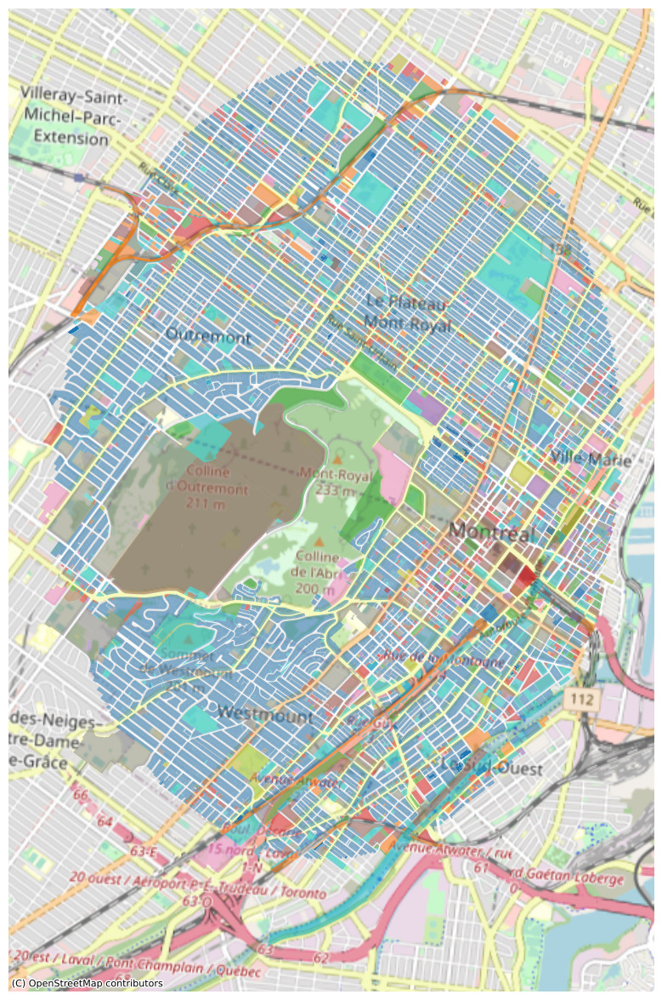

In [2]:
data_PCL_bldg=ut.building_extract(x=-73.589693,y=45.508574,r=0.035)
display(data_PCL_bldg.head())
data_PCL_bldg["landuse_code"]=data_PCL_bldg["landuse_code"].astype("category")
ut.plot_it(buildings_list=data_PCL_bldg,column="landuse_code",legend=False,alpha=0.5)

Fetching Metadata. Please Wait ...
Tracts collection acquired
selecting 105 tracts in 3333 m radius of point -73.589693,45.508574


,CMANAME,CMAPUID,CMATYPE,CMAUID,CTNAME,CTUID,PRNAME,PRUID,geom,index
0,Montréal,24462,B,462,0137.00,462013700,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",304
1,Montréal,24462,B,462,0138.00,462013800,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",305
2,Montréal,24462,B,462,0050.00,462005000,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",309
3,Montréal,24462,B,462,0051.00,462005100,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",310
4,Montréal,24462,B,462,0052.00,462005200,Quebec / Québec,24,"{'type': 'MultiPolygon', 'crs': {'type': 'name...",311


there is 'geom' in columns


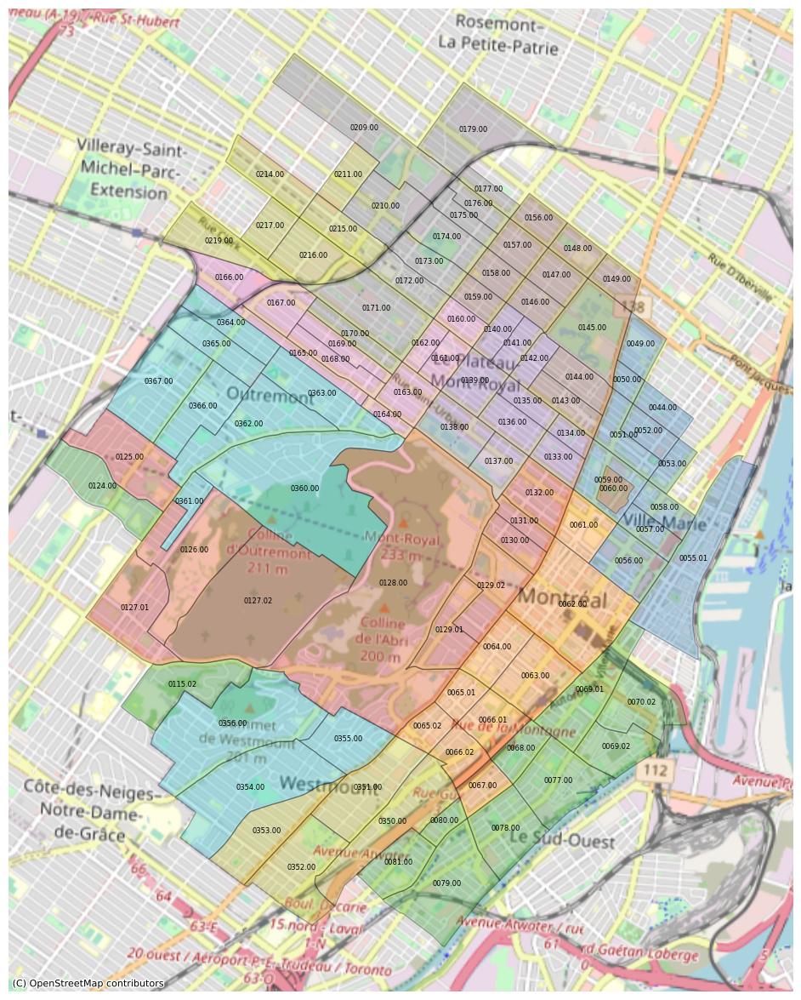

In [3]:
data_tracts=ut.tract_extract(x=-73.589693,y=45.508574,r=0.03)

display(data_tracts.head())
ut.plot_it(data_tracts,multipolygon=True,alpha=0.3,column="CTNAME",labeled=True)


## from HQ scrapper

In [4]:
bldg_success_list=pd.read_csv(r"C:\Users\msham\OneDrive\Documents\GitHub\PyCityLayers-OB-extension\bldg_success_list.csv")
bldg_success_list=bldg_success_list.rename({"PycityLayers Index":"index"},axis=1) #PycityLayers Index,Street_no,Postal_Code,Error_Code,Price,Consumption,City ID,Address
bldg_success_list["Price"]=bldg_success_list["Price"].apply(lambda x: x.replace(',',''))
bldg_success_list.astype({'Postal_Code': 'category',"Price":"int64"})
bldg_success_list

,index,Street_no,Postal_Code,Error_Code,Price,Consumption,City ID,Address
0,219467,4695,H2J 2V4,0,1750,17880,501408629,4695 rue Resther Montréal QC H2J 2V4
1,171065,4170,H2L 3M8,0,1270,12960,502588431,4170 av du Parc-Lafontaine Montréal QC H2L 3M8
2,20022,759,H2J 1T8,0,1920,18850,503475167,759 rue de Bienville Montréal QC H2J 1T8
3,243369,4696,H2J 2T5,0,2330,22880,501405524,4696 rue Pontiac Montréal QC H2J 2T5
4,86426,4403,H2J 3X7,0,1580,15630,500793080,4403 rue Marquette Montréal QC H2J 3X7
...,...,...,...,...,...,...,...,...
5454,5338,371,H2Z 1B6,0,490,4000,502194341,202-371 rue Dowd Montréal QC H2Z 1B6
5455,5338,371,H2Z 1B6,0,3030,29260,500877651,301-371 rue Dowd Montréal QC H2Z 1B6
5456,5338,371,H2Z 1B6,0,4440,41880,500877660,401-371 rue Dowd Montréal QC H2Z 1B6
5457,5338,371,H2Z 1B6,0,3530,33120,500877627,371 rue Dowd Montréal QC H2Z 1B6


## from Kartikay's dataset

,FID,Z_Min,Z_Max,Z_Mean,ID_UEV,NOM_RUE,ETAGE_HORS,NOMBRE_LOG,ANNEE_CONS,CODE_UTILI,...,elevmin,elevmax,bldgarea,g_usag_pre,NewHieght,New_Area,ORIG_FID,Shape_Leng,Shape_Area,geometry
0,0,46.35,58.62,53.703230,01034311,avenue du Mont-Royal Est (MTL),3,0,1900,1000,...,45.63,48.13,5060.54,Résidentiel,10,227,30937,0.000856,2.618038e-08,"POLYGON ((-73.57286 45.53489, -73.57318 45.535..."
1,1,46.35,60.51,54.938453,01034313,avenue du Mont-Royal Est (MTL),3,0,1926,1000,...,45.63,48.13,5060.54,Résidentiel,12,227,30938,0.000859,2.619705e-08,"POLYGON ((-73.57291 45.53484, -73.57323 45.534..."
2,2,45.86,69.96,63.604901,01000129,rue Hutchison (MTL+OUT),2,0,1900,1000,...,44.10,45.82,1565.69,Résidentiel,24,8,30939,0.000435,9.536496e-10,"POLYGON ((-73.57329 45.50833, -73.57330 45.508..."
3,3,45.92,84.33,63.772476,01000132,rue Hutchison (MTL+OUT),3,0,1900,1000,...,44.32,45.95,1285.24,Résidentiel,38,103,30940,0.000520,1.181612e-08,"POLYGON ((-73.57359 45.50847, -73.57359 45.508..."
4,4,65.88,76.53,73.157252,01002301,rue Villeneuve Ouest (MTL),2,0,1900,1000,...,63.97,66.25,1365.09,Résidentiel,10,139,30941,0.000665,1.605543e-08,"POLYGON ((-73.59066 45.51961, -73.59081 45.519..."


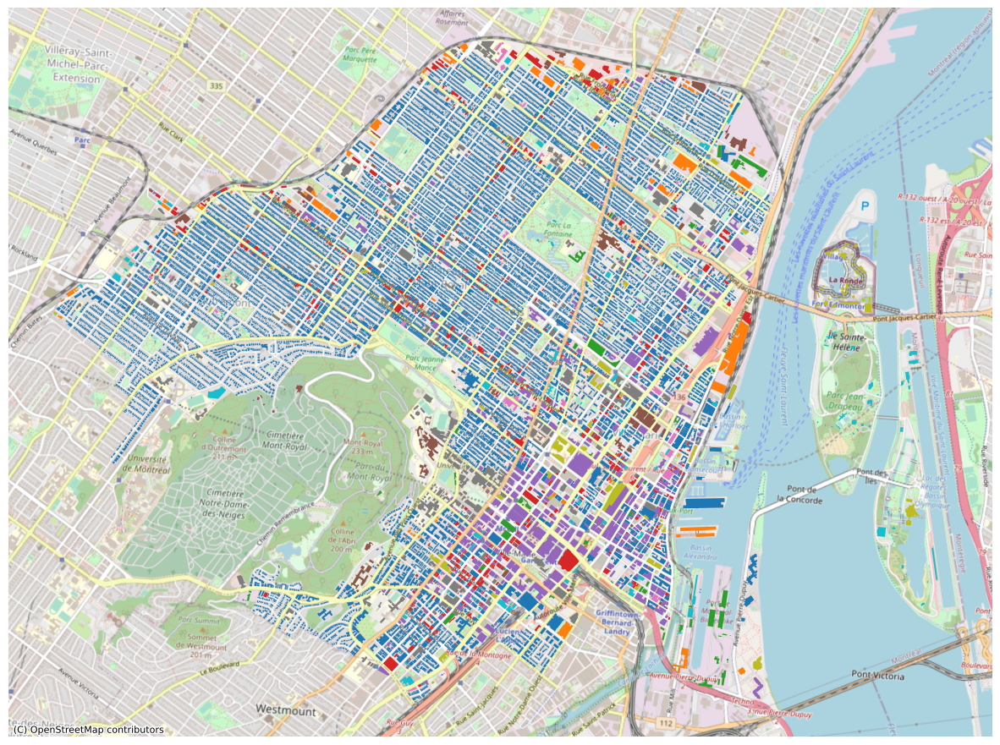

In [5]:
Data_K_bldg=gpd.read_file("Masood_data2_FeaturesToJSON.geojson")
display(Data_K_bldg.head())
ut.plot_it(Data_K_bldg,column='CODE_UTILI')

# Merge datasets into a main dataset in two steps
1. building lots & Tract & electricity consumption
* full_df_PCL: PCL_bldg + PCL_Tract + HQ
* merged based on: Index, geometry (.contains)
2. building footprints & full_df_PCL
* final_df: K_bldg + full_df_PCL
* merged based on: ID_UEV, geometry (.contains)

In [6]:
mask=data_PCL_bldg["index"].isin(bldg_success_list["index"])
mask
covered_bldgs_citylayers=data_PCL_bldg[mask]
display(len(covered_bldgs_citylayers))
display(covered_bldgs_citylayers.head())

3886

,borough_id,building_number,built_area,dwelling_number,firstletter_apt,geom,index,land_area,landuse_code,landuse_text,...,max_floors,municipality_code,nad83_registration,street_name,street_number,uid,unit_category,unit_number,year_built,geometry
4,REM19,2204,189,1,0,"{'type': 'Polygon', 'crs': {'type': 'name', 'p...",10,166,1000,Logement,...,2,50,9839-10-9905-2-000-0000,boulevard De Maisonneuve Ouest (MTL+WMT),2206,1037773,Régulier,0,1900,"POLYGON ((-73.58429 45.49090, -73.58453 45.491..."
17,REM19,1947,0,1,0,"{'type': 'Polygon', 'crs': {'type': 'name', 'p...",39,65,1000,Logement,...,1,50,9839-32-4151-2-001-0010,boulevard De Maisonneuve Ouest (MTL+WMT),1947,1037737,Condominium,7,1910,"POLYGON ((-73.58276 45.49334, -73.58285 45.493..."
49,REM21,2025,351,2,0,"{'type': 'Polygon', 'crs': {'type': 'name', 'p...",90,231,1000,Logement,...,3,50,9943-09-9900-5-000-0000,avenue du Mont-Royal Est (MTL),2029,1034308,Régulier,0,1910,"POLYGON ((-73.57301 45.53505, -73.57310 45.535..."
81,REM19,1235,404,1,0,"{'type': 'Polygon', 'crs': {'type': 'name', 'p...",143,36,1000,Logement,...,1,50,9838-38-9882-6-001-0003,rue du Sussex (MTL),1235,1002503,Condominium,0,1900,"POLYGON ((-73.58193 45.48974, -73.58179 45.489..."
92,REM19,3468,168,1,0,"{'type': 'Polygon', 'crs': {'type': 'name', 'p...",159,91,1000,Logement,...,2,50,9840-50-0850-3-000-0000,rue de la Montagne (MTL),3468,1036327,Régulier,0,1925,"POLYGON ((-73.58049 45.50042, -73.58058 45.500..."


In [7]:
temp_df=bldg_success_list.copy()[["index","Consumption","Price","Address"]]
temp_df.loc[:, "Consumption"] = temp_df.loc[:, "Consumption"].astype("int64")
temp_df.loc[:, "Price"]=temp_df.loc[:, "Price"].astype("int64")

# temp_df=temp_df.groupby(by="index",axis=0).sum()
new_df_PCL=pd.merge(temp_df,covered_bldgs_citylayers,on="index")
new_df_PCL['ID_UEV']='0' + new_df_PCL['uid'].astype(str)

display(new_df_PCL.head())

C:\Users\msham\AppData\Local\Temp\ipykernel_23052\443618378.py:3: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_df.loc[:, "Price"]=temp_df.loc[:, "Price"].astype("int64")


,index,Consumption,Price,Address,borough_id,building_number,built_area,dwelling_number,firstletter_apt,geom,...,municipality_code,nad83_registration,street_name,street_number,uid,unit_category,unit_number,year_built,geometry,ID_UEV
0,219467,17880,1750,4695 rue Resther Montréal QC H2J 2V4,REM21,4693,164,2,0,"{'type': 'Polygon', 'crs': {'type': 'name', 'p...",...,50,9843-20-2703-9-000-0000,rue Resther (MTL),4695,1025372,Régulier,0,1910,"POLYGON ((-73.58410 45.52701, -73.58425 45.526...",01025372
1,171065,12960,1270,4170 av du Parc-Lafontaine Montréal QC H2L 3M8,REM21,4166,404,3,0,"{'type': 'Polygon', 'crs': {'type': 'name', 'p...",...,50,9942-07-0392-0-000-0000,avenue du Parc-La Fontaine (MTL),4170,1017377,Régulier,0,1900,"POLYGON ((-73.57438 45.52492, -73.57429 45.524...",01017377
2,20022,18850,1920,759 rue de Bienville Montréal QC H2J 1T8,REM21,759,152,1,0,"{'type': 'Polygon', 'crs': {'type': 'name', 'p...",...,50,9842-29-8770-5-000-0000,rue De Bienville (MTL),759,1027767,Régulier,0,1900,"POLYGON ((-73.58354 45.52667, -73.58326 45.526...",01027767
3,243369,22880,2330,4696 rue Pontiac Montréal QC H2J 2T5,REM21,4696,146,1,0,"{'type': 'Polygon', 'crs': {'type': 'name', 'p...",...,50,9842-29-0039-3-000-0000,rue Pontiac (MTL),4696,1025244,Régulier,0,1900,"POLYGON ((-73.58451 45.52641, -73.58458 45.526...",01025244
4,86426,15630,1580,4403 rue Marquette Montréal QC H2J 3X7,REM21,4403,85,1,0,"{'type': 'Polygon', 'crs': {'type': 'name', 'p...",...,50,9943-05-3542-9-001-0004,rue Marquette (MTL),4403,2165796,Condominium,0,1922,"POLYGON ((-73.57369 45.53192, -73.57374 45.531...",02165796


there is 'geom' in columns


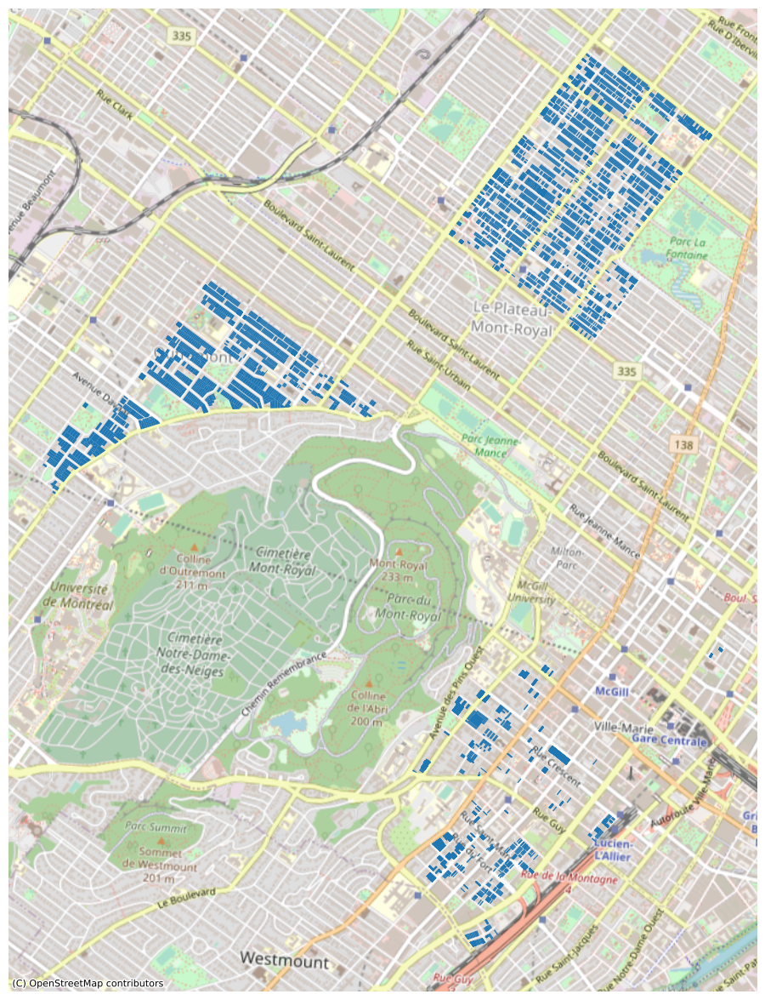

In [8]:
ut.plot_it(new_df_PCL)


In [9]:
# function tract_assign outputs two dataframes, the 1st one is the full input with an added column for the tracts. That is what we want. 
full_df_PCL,assigned_indexes=ut.tract_assign(new_df_PCL,x=-73.576861,y=45.513616,r=0.02)

Fetching Metadata. Please Wait ...
Tracts collection acquired
selecting 66 tracts in 2222 m radius of point -73.576861,45.513616
check for tract0050.00 which is 1 / 66
check for tract0051.00 which is 2 / 66
check for tract0052.00 which is 3 / 66
check for tract0056.00 which is 4 / 66
check for tract0057.00 which is 5 / 66
check for tract0059.00 which is 6 / 66
check for tract0060.00 which is 7 / 66
check for tract0061.00 which is 8 / 66
check for tract0062.00 which is 9 / 66
check for tract0048.00 which is 10 / 66
check for tract0049.00 which is 11 / 66
check for tract0143.00 which is 12 / 66
check for tract0144.00 which is 13 / 66
check for tract0145.00 which is 14 / 66
check for tract0149.00 which is 15 / 66
check for tract0133.00 which is 16 / 66
check for tract0134.00 which is 17 / 66
check for tract0148.00 which is 18 / 66
check for tract0128.00 which is 19 / 66
check for tract0130.00 which is 20 / 66
check for tract0131.00 which is 21 / 66
check for tract0132.00 which is 22 / 66


there is 'geom' in columns


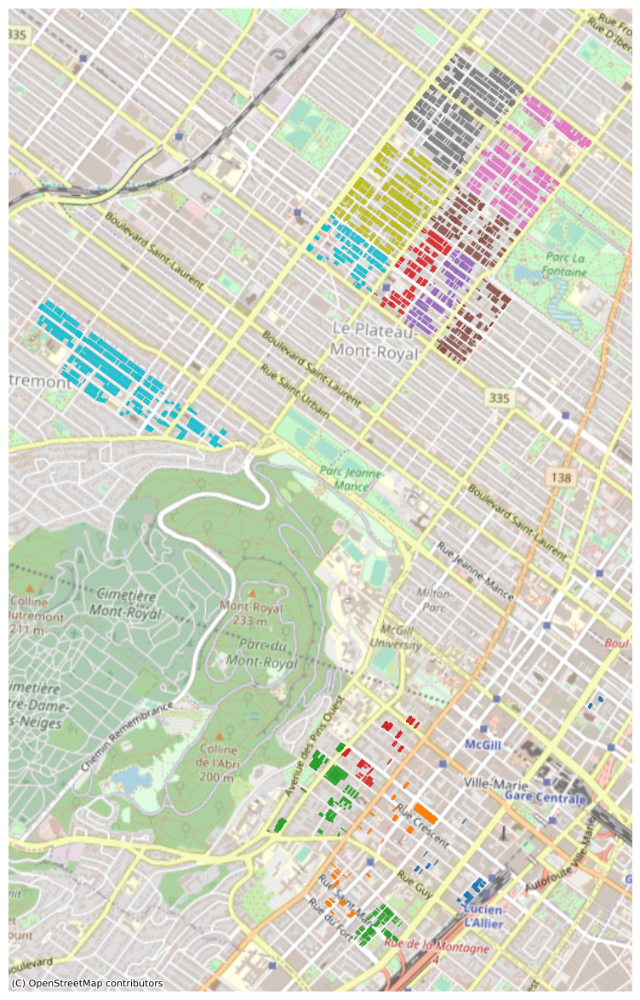

In [10]:
ut.plot_it(full_df_PCL,column='Tract')

STEP 1: full_df_PCL is finalized

Next: K_bldgs integrate

In [11]:
mask2=Data_K_bldg["ID_UEV"].isin(full_df_PCL["ID_UEV"])
covered_bldgs_K=Data_K_bldg[mask2]
display(len(covered_bldgs_K))
display(covered_bldgs_K.head())


3636

,FID,Z_Min,Z_Max,Z_Mean,ID_UEV,NOM_RUE,ETAGE_HORS,NOMBRE_LOG,ANNEE_CONS,CODE_UTILI,...,elevmin,elevmax,bldgarea,g_usag_pre,NewHieght,New_Area,ORIG_FID,Shape_Leng,Shape_Area,geometry
20,20,46.31,58.71,56.328873,01034308,avenue du Mont-Royal Est (MTL),3,0,1910,1000,...,45.63,48.13,5060.54,Résidentiel,11,136,30957,0.000850,1.563273e-08,"POLYGON ((-73.57299 45.53504, -73.57303 45.534..."
50,50,50.72,65.75,61.608565,01034596,boulevard Saint-Joseph Est (MTL),3,0,1929,1000,...,50.26,51.94,1640.79,Résidentiel,14,206,30982,0.000744,2.378170e-08,"POLYGON ((-73.57963 45.53450, -73.57983 45.534..."
60,60,66.35,75.38,73.292630,01003551,place Redpath (MTL),2,0,1923,1000,...,61.89,66.24,735.26,Terrain vague,9,92,30994,0.000453,1.060360e-08,"POLYGON ((-73.58169 45.49885, -73.58183 45.498..."
75,75,57.14,59.85,57.413060,01034551,rue Gilford (MTL),2,0,1910,1000,...,49.63,50.25,972.89,Résidentiel,10,85,31011,0.000442,9.735089e-09,"POLYGON ((-73.57935 45.53335, -73.57949 45.533..."
76,76,57.14,59.85,57.413060,01034551,rue Gilford (MTL),2,0,1910,1000,...,49.63,50.25,972.89,Résidentiel,10,5,31011,0.000171,5.399911e-10,"POLYGON ((-73.57961 45.53340, -73.57961 45.533..."


In [12]:
new_df_K=pd.merge(covered_bldgs_K,full_df_PCL,on="ID_UEV")
display(len(new_df_K))
display(new_df_K.head())

14450

,FID,Z_Min,Z_Max,Z_Mean,ID_UEV,NOM_RUE,ETAGE_HORS,NOMBRE_LOG,ANNEE_CONS,CODE_UTILI,...,nad83_registration,street_name,street_number,uid,unit_category,unit_number,year_built,geometry_y,Index,Tract
0,20,46.31,58.71,56.328873,01034308,avenue du Mont-Royal Est (MTL),3,0,1910,1000,...,9943-09-9900-5-000-0000,avenue du Mont-Royal Est (MTL),2029,1034308,Régulier,0,1910,"POLYGON ((-73.57301 45.53505, -73.57310 45.535...",2570,0156.00
1,50,50.72,65.75,61.608565,01034596,boulevard Saint-Joseph Est (MTL),3,0,1929,1000,...,9843-58-7146-6-000-0000,boulevard Saint-Joseph Est (MTL),1656,1034596,Régulier,0,1929,"POLYGON ((-73.57992 45.53453, -73.57965 45.534...",85,0157.00
2,50,50.72,65.75,61.608565,01034596,boulevard Saint-Joseph Est (MTL),3,0,1929,1000,...,9843-58-7146-6-000-0000,boulevard Saint-Joseph Est (MTL),1656,1034596,Régulier,0,1929,"POLYGON ((-73.57992 45.53453, -73.57965 45.534...",86,0157.00
3,50,50.72,65.75,61.608565,01034596,boulevard Saint-Joseph Est (MTL),3,0,1929,1000,...,9843-58-7146-6-000-0000,boulevard Saint-Joseph Est (MTL),1656,1034596,Régulier,0,1929,"POLYGON ((-73.57992 45.53453, -73.57965 45.534...",87,0157.00
4,50,50.72,65.75,61.608565,01034596,boulevard Saint-Joseph Est (MTL),3,0,1929,1000,...,9843-58-7146-6-000-0000,boulevard Saint-Joseph Est (MTL),1656,1034596,Régulier,0,1929,"POLYGON ((-73.57992 45.53453, -73.57965 45.534...",88,0157.00


In [13]:
final_df=new_df_K[['ID_UEV','ETAGE_HORS','NOMBRE_LOG','ANNEE_CONS','CODE_UTILI','geometry_x','Consumption','Price','built_area','dwelling_number','land_area','max_floors','unit_number','year_built','Tract']]
final_df=final_df.rename(columns={'geometry_x':'geometry'}).set_geometry('geometry')
final_df

,ID_UEV,ETAGE_HORS,NOMBRE_LOG,ANNEE_CONS,CODE_UTILI,geometry,Consumption,Price,built_area,dwelling_number,land_area,max_floors,unit_number,year_built,Tract
0,01034308,3,0,1910,1000,"POLYGON ((-73.57299 45.53504, -73.57303 45.534...",15540,1520,351,2,231,3,0,1910,0156.00
1,01034596,3,0,1929,1000,"POLYGON ((-73.57963 45.53450, -73.57983 45.534...",6390,670,575,7,250,3,0,1929,0157.00
2,01034596,3,0,1929,1000,"POLYGON ((-73.57963 45.53450, -73.57983 45.534...",6390,670,575,7,250,3,0,1929,0157.00
3,01034596,3,0,1929,1000,"POLYGON ((-73.57963 45.53450, -73.57983 45.534...",6390,670,575,7,250,3,0,1929,0157.00
4,01034596,3,0,1929,1000,"POLYGON ((-73.57963 45.53450, -73.57983 45.534...",6390,670,575,7,250,3,0,1929,0157.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14445,01037711,4,0,1910,1000,"POLYGON ((-73.58230 45.49326, -73.58224 45.493...",15350,1490,529,4,304,4,0,1910,0065.01
14446,01037521,2,0,1885,1000,"POLYGON ((-73.57906 45.49286, -73.57918 45.492...",24380,2490,164,2,197,2,0,1885,0066.01
14447,01037521,2,0,1885,1000,"POLYGON ((-73.57926 45.49297, -73.57931 45.493...",24380,2490,164,2,197,2,0,1885,0066.01
14448,01003966,2,0,1900,1000,"POLYGON ((-73.58663 45.49668, -73.58686 45.496...",48680,5210,351,1,319,2,0,1900,0129.01


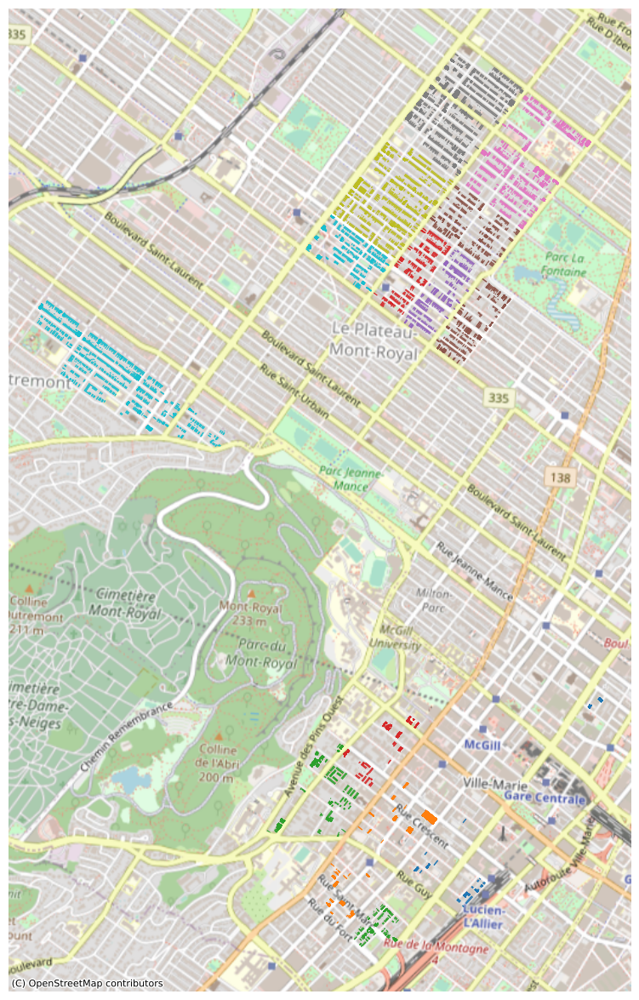

In [14]:
ut.plot_it(final_df,column='Tract')

final_df: done

In [25]:
final_df=final_df.to_crs('EPSG:32198')
final_df['area']=final_df.geometry.area
px.scatter(final_df['area'])

In [43]:
aggregated_df = final_df.groupby('ID_UEV').agg({
    'Consumption': 'sum',
    'Price': 'sum',
    'geometry': lambda x: x.loc[x.area.idxmax()] if len(x) > 0 else None,
    'built_area': 'first',
    'dwelling_number': 'first',
    'land_area': 'max',
    'year_built': 'first',
    'Tract': 'first'
}).reset_index()

# Replace the original geodataframe with the aggregated one
gdf = aggregated_df


In [44]:
gdf=gpd.GeoDataFrame(gdf,geometry=gdf['geometry'],crs='EPSG:32198')

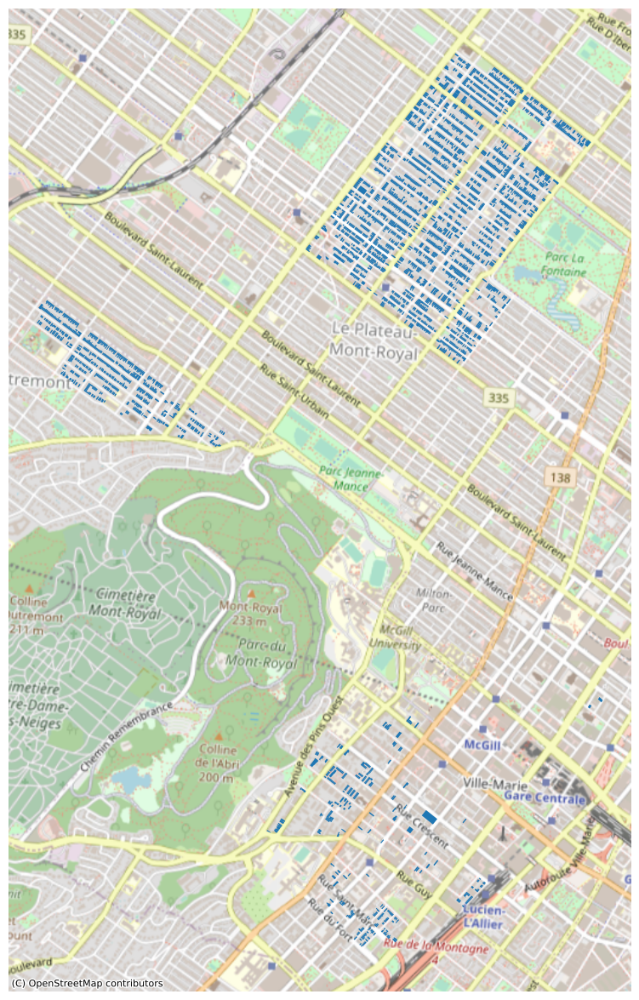

In [45]:
ut.plot_it(gdf)

In [48]:
gdf['area']=gdf.geometry.area

In [51]:
px.scatter(gdf['area'])

In [46]:
gdf[gdf['built_area']<1]

,ID_UEV,Consumption,Price,geometry,built_area,dwelling_number,land_area,year_built,Tract
22,01003437,4679370,466560,"POLYGON ((-397441.667 181322.816, -397441.416 ...",0,1,120,1982,0129.01
117,01015934,14720,1540,"POLYGON ((-396971.437 183844.168, -396967.182 ...",0,1,130,1934,0140.00
157,01016077,17220,1750,"POLYGON ((-396844.485 183801.157, -396845.313 ...",0,1,130,1885,0141.00
303,01016626,18990,1950,"POLYGON ((-396865.231 184043.472, -396868.718 ...",0,3,229,1917,0140.00
318,01016717,586180,55720,"POLYGON ((-396477.309 183779.800, -396472.361 ...",0,6,218,2004,0142.00
...,...,...,...,...,...,...,...,...,...
3202,05282914,30580,3060,"POLYGON ((-396213.982 184498.188, -396214.662 ...",0,1,91,2020,0147.00
3203,05282930,29740,1790,"POLYGON ((-398832.485 183583.063, -398850.053 ...",0,1,109,1910,0363.00
3204,05283069,20210,2050,"POLYGON ((-397082.772 184230.761, -397083.271 ...",0,1,92,1900,0159.00
3205,05287290,16160,1580,"POLYGON ((-397049.265 184575.397, -397043.911 ...",0,1,116,1925,0158.00


In [70]:
px.scatter(gdf['area'])

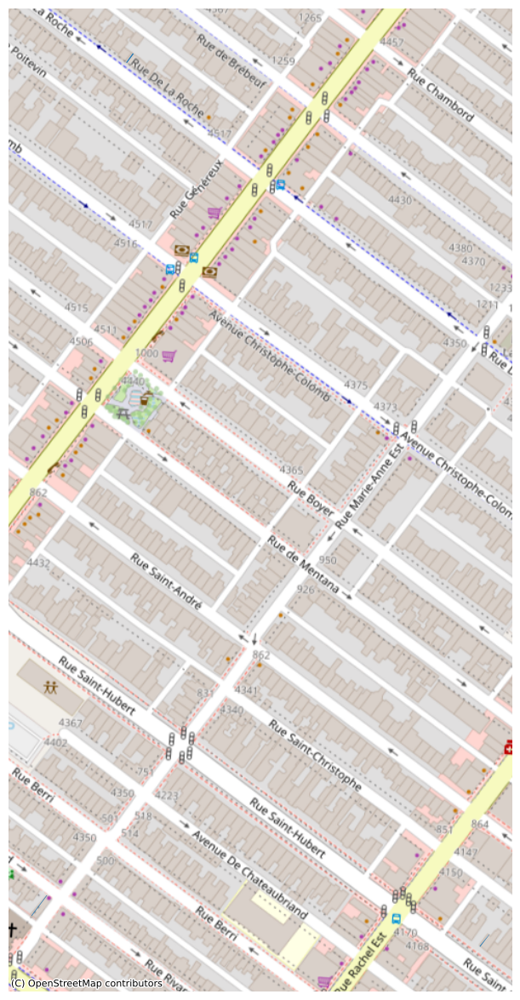

In [69]:
ut.plot_it(gdf[gdf['area']<20])